<a href="https://colab.research.google.com/github/embarbos/STA_160_Midterm_Project/blob/main/STA_160_Midterm_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# general imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [ ]:
# gdrive mounting
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#Sandeep path
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/hd_data.csv')

In [ ]:
# lizzy's path
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/STA 160/hd_data.csv')

In [ ]:
#Jenny's path
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/hd_data.csv')

In [ ]:
# Emilio's Path
data = pd.read_csv('/content/drive/MyDrive/hd_data.csv')

PRE-PROCESSING

In [ ]:
# RE-ENCODE BMI COLUMN TO SPECIFIC BINS
column_name = 'BMI'

# Define the bin edges
bin_edges = [0, 19, 25, 30, np.inf]

# Define the labels for the bins
bin_labels = ['Underweight', 'Normal', 'Overweight', 'Obese']

# Bin the values in the column
data[f"{column_name}_binned"] = pd.cut(data[column_name], bins=bin_edges, labels=bin_labels, right=False, include_lowest=True)

# RE-ENCODE MENTHEALTH COLUMN

column_name = 'MentHlth'

# Define the bin edges
bin_edges = [0, 10, 20, np.inf]

# Define the labels for the bins
bin_labels = ['< 10 days', '10-20 days', '20+ days']

# Bin the values in the column
data[f"{column_name}_binned"] = pd.cut(data[column_name], bins=bin_edges, labels=bin_labels, right=False, include_lowest=True)

# RE-ENCODE PHYSHEALTH COLUMN

column_name = 'PhysHlth'

# Define the bin edges
bin_edges = [0, 10, 20, np.inf]

# Define the labels for the bins
bin_labels = ['< 10 days', '10-20 days', '20+ days']

# Bin the values in the column
data[f"{column_name}_binned"] = pd.cut(data[column_name], bins=bin_edges, labels=bin_labels, right=False, include_lowest=True)

In [ ]:
pd.crosstab(index=[data['BMI_binned'], data['Diabetes']], columns=[data['HeartDiseaseorAttack'], data['Stroke']])

HeartDiseaseorAttack    0.0         1.0     
Stroke                  0.0   1.0   0.0  1.0
BMI_binned  Diabetes                        
Underweight 0.0        2547   103   213   67
            1.0          21     2     1    4
            2.0         105    18    34   12
Normal      0.0       59270  1306  3168  592
            1.0         579    30    67   13
            2.0        2843   206   682  197
Overweight  0.0       73818  1707  5148  858
            1.0        1220    52   216   38
            2.0        7734   504  1917  537
Obese       0.0       58158  1443  4622  683
            1.0        1983    80   279   46
            2.0       15154   904  3609  890

Text(0.5, 1.0, 'Correlation Matrix')

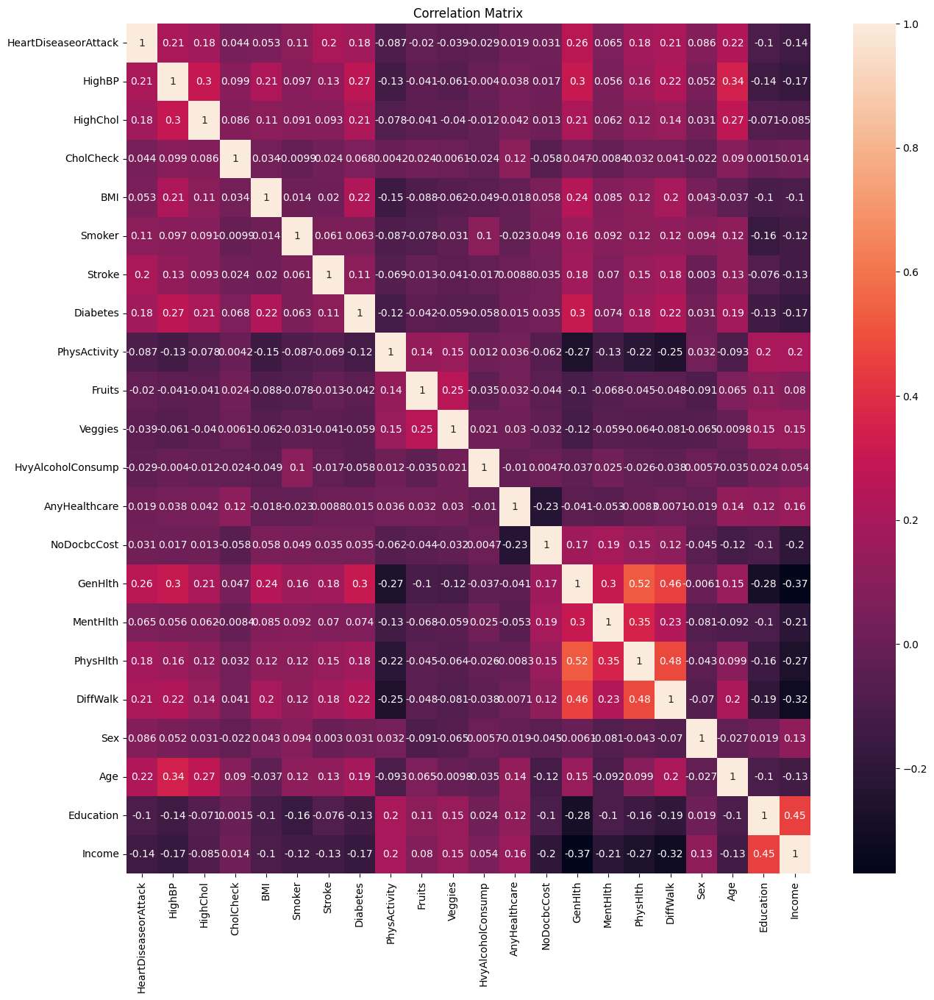

In [ ]:
plt.figure(figsize = (15,15))
sns.heatmap(data.corr(),annot = True)
plt.title("Correlation Matrix")

In [ ]:
data.hist(bins=20, figsize=(15,15));

NameError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 190 CLUSTER MAPS-- ROW-WISE PROPORTIONS

from itertools import combinations
import seaborn as sns

# Get the columns to be used in combinations
#remaining_columns = data.columns[1:6].tolist() + data.columns[7:].tolist()

# Generate all possible column combinations
column_combinations = list(combinations(remaining_columns, 2))

# Create cluster maps for each combination
for idx, combination in enumerate(column_combinations, start=1):
    selected_columns = ['HeartDiseaseorAttack', 'Stroke'] + list(combination)

    # Create the contingency table
    contingency_table = pd.crosstab(index=[data[selected_columns[0]], data[selected_columns[1]]],
                                    columns=[data[selected_columns[2]], data[selected_columns[3]]])

    # Calculate row-wise proportions
    row_sums = contingency_table.sum(axis=1)
    contingency_table_proportions = contingency_table.div(row_sums, axis=0)

    # Create cluster map using the contingency table with proportions
    g = sns.clustermap(contingency_table_proportions, cmap='coolwarm', metric='euclidean', method='ward')

    # Set plot title
    g.fig.suptitle(f"Cluster Map {idx}: {', '.join(selected_columns)}", fontsize=14, y=1.05)

ODDS

Odds for HighBP
  HighBP Odds_HeartDisease Odds_Stroke Odds_Combined
0    0.0          0.038165    0.014085      0.005389
1    1.0          0.170327    0.051182      0.036993




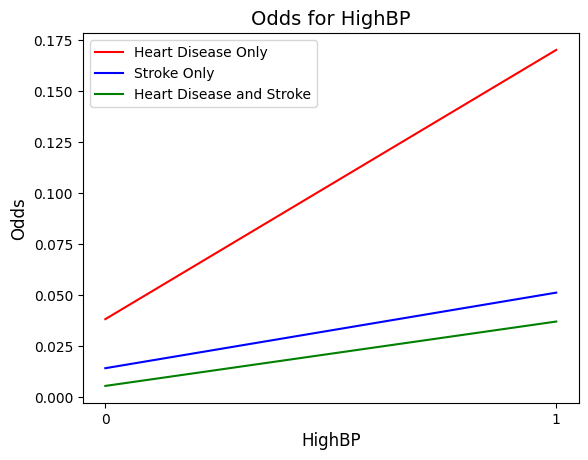

Odds for HighChol
  HighChol Odds_HeartDisease Odds_Stroke Odds_Combined
0      0.0          0.044254    0.018568      0.008086
1      1.0          0.159959    0.043923      0.032569




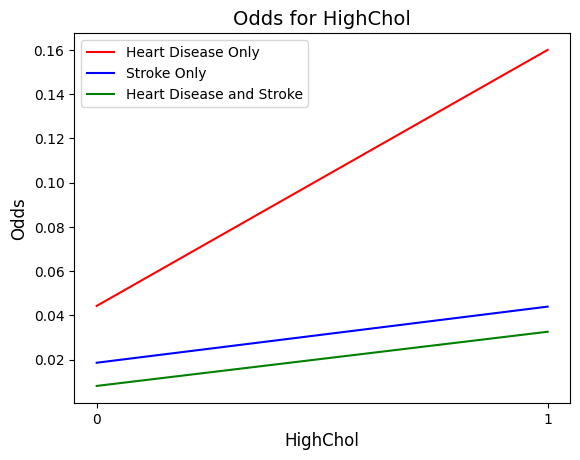

Odds for Smoker
  Smoker Odds_HeartDisease Odds_Stroke Odds_Combined
0    0.0          0.059595     0.02185      0.010701
1    1.0          0.130169    0.037505      0.027133




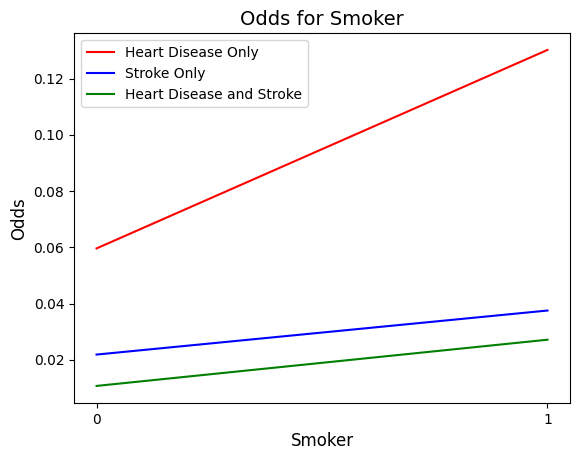

Odds for Diabetes
  Diabetes Odds_HeartDisease Odds_Stroke Odds_Combined
0      0.0          0.067861    0.023525      0.011352
1      1.0          0.148041    0.043124      0.026558
2      2.0          0.241601    0.063168      0.063322




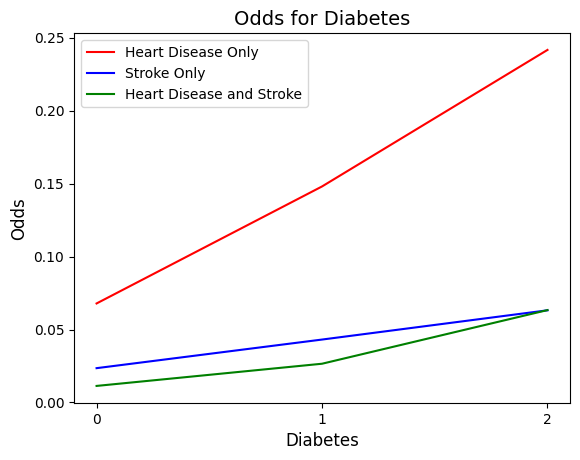

Odds for PhysActivity
  PhysActivity Odds_HeartDisease Odds_Stroke Odds_Combined
0          0.0          0.135442     0.04499      0.033453
1          1.0          0.075715    0.023564      0.012952




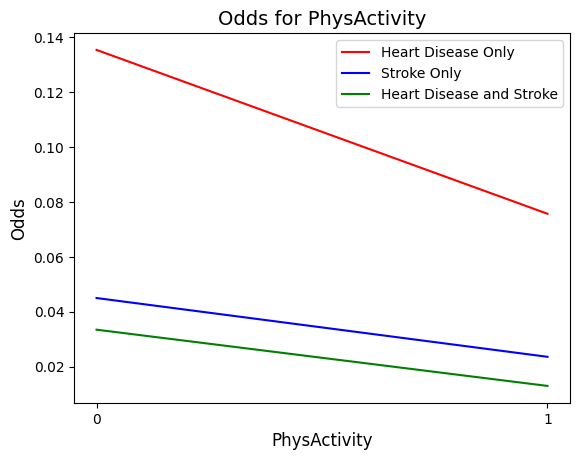

Odds for Fruits
  Fruits Odds_HeartDisease Odds_Stroke Odds_Combined
0    0.0          0.097099    0.030824      0.019729
1    1.0          0.084903    0.027092      0.016425




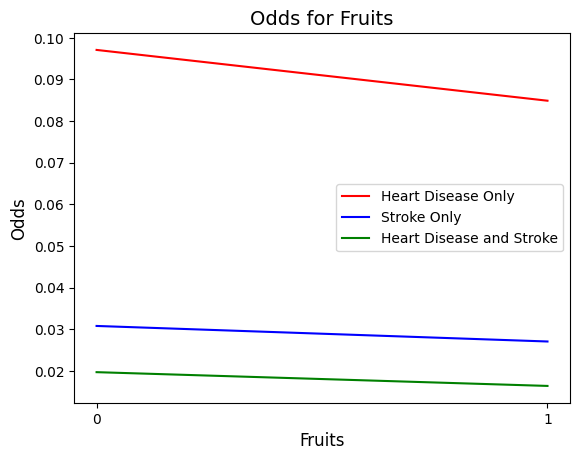

Odds for Veggies
  Veggies Odds_HeartDisease Odds_Stroke Odds_Combined
0     0.0          0.112199    0.040795      0.026934
1     1.0          0.084243    0.025704      0.015556




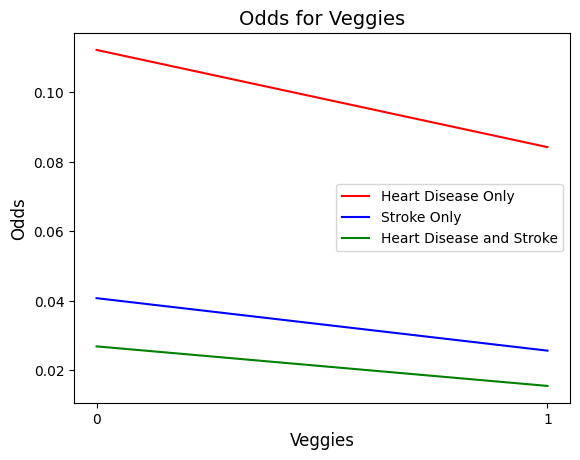

Odds for HvyAlcoholConsump
  HvyAlcoholConsump Odds_HeartDisease Odds_Stroke Odds_Combined
0               0.0          0.091416     0.02895       0.01817
1               1.0          0.055704    0.020318      0.008827




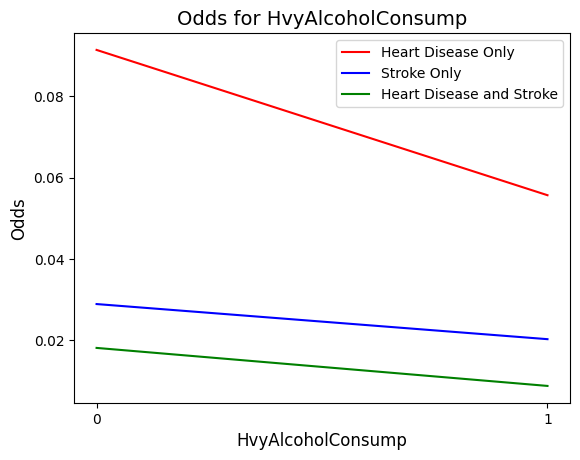

Odds for AnyHealthcare
  AnyHealthcare Odds_HeartDisease Odds_Stroke Odds_Combined
0           0.0          0.062655    0.021858      0.014336
1           1.0          0.090736    0.028793      0.017796




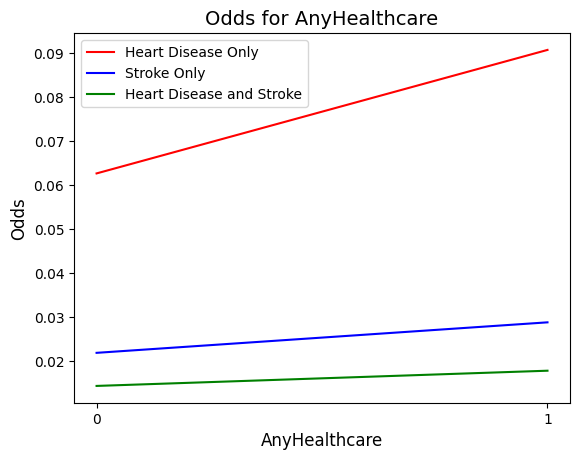

Odds for NoDocbcCost
  NoDocbcCost Odds_HeartDisease Odds_Stroke Odds_Combined
0         0.0          0.087365    0.027483      0.016044
1         1.0           0.11158    0.039398      0.035619




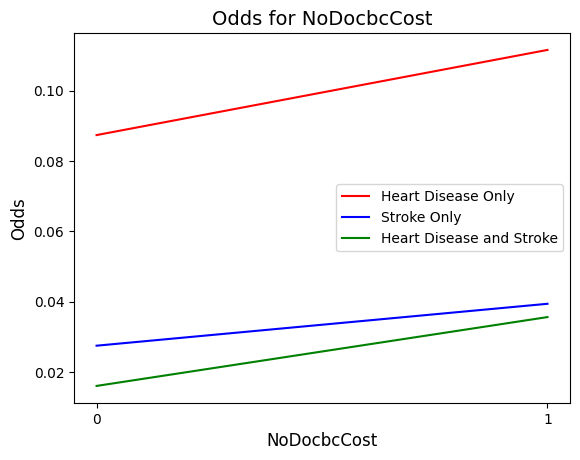

Odds for DiffWalk
  DiffWalk Odds_HeartDisease Odds_Stroke Odds_Combined
0      0.0          0.064215    0.019096      0.008084
1      1.0          0.250557    0.088481      0.078878




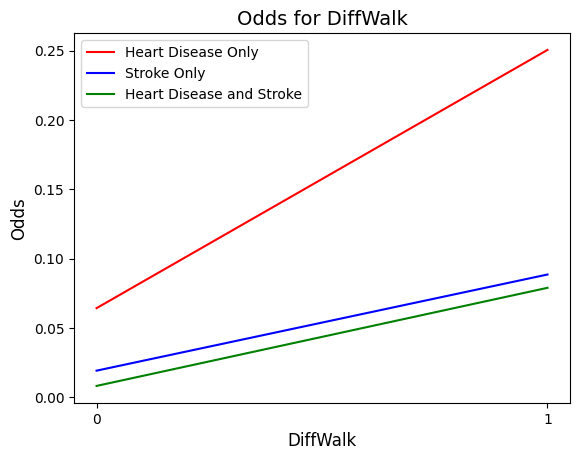

Odds for Sex
   Sex Odds_HeartDisease Odds_Stroke Odds_Combined
0  0.0          0.064634    0.029333      0.015084
1  1.0           0.12243    0.027249      0.021023




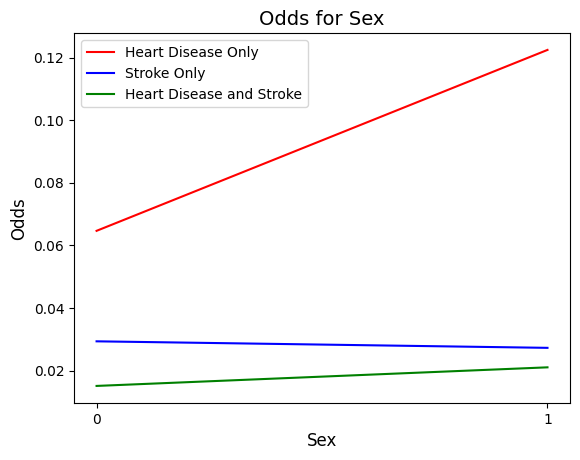

Odds for Age
     Age Odds_HeartDisease Odds_Stroke Odds_Combined
0    1.0          0.004244    0.002829      0.000884
1    2.0          0.006248    0.002925      0.000931
2    3.0          0.009233    0.005302      0.002285
3    4.0          0.011904    0.007763      0.002366
4    5.0          0.019718    0.011908      0.002753
5    6.0          0.031774    0.013526      0.005994
6    7.0          0.048938    0.020125      0.009468
7    8.0          0.066392    0.024521      0.014375
8    9.0          0.097321    0.030303      0.018444
9   10.0          0.131114    0.035923       0.02401
10  11.0          0.178211    0.050075      0.033401
11  12.0          0.213265    0.064426      0.042207
12  13.0           0.27776     0.07964      0.062306




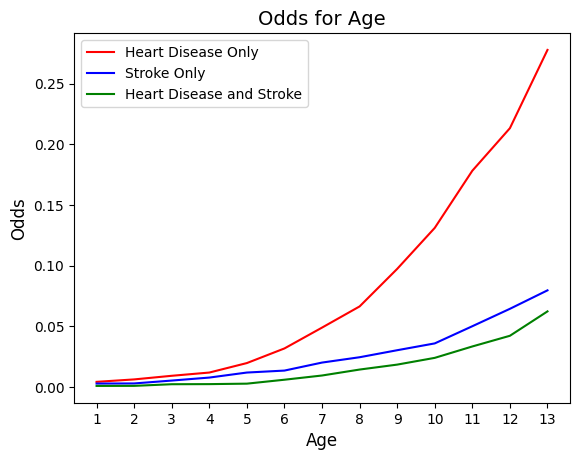

Odds for Education
  Education Odds_HeartDisease Odds_Stroke Odds_Combined
0       1.0          0.142857    0.035714      0.064286
1       2.0          0.192965    0.053566      0.058083
2       3.0          0.167702    0.061302       0.05077
3       4.0          0.115841    0.037594      0.024306
4       5.0          0.094401    0.030055      0.018723
5       6.0           0.06254    0.019206      0.009476




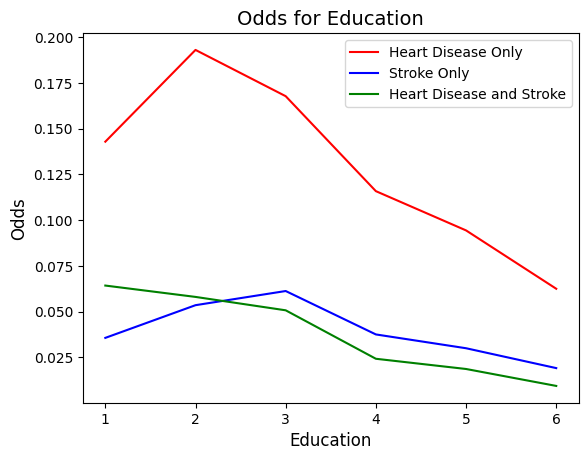

Odds for Income
  Income Odds_HeartDisease Odds_Stroke Odds_Combined
0    1.0          0.146809    0.062532      0.053011
1    2.0          0.185537    0.071421       0.06002
2    3.0          0.154269     0.05736      0.043393
3    4.0          0.138115    0.046562      0.032896
4    5.0          0.120024    0.039718      0.024618
5    6.0          0.098004     0.02874      0.016266
6    7.0          0.077375    0.022129      0.010012
7    8.0           0.04888    0.012772      0.005241




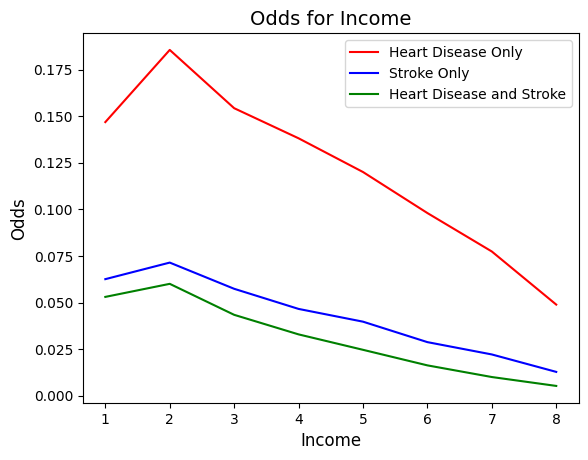

Odds for BMI_binned
    BMI_binned Odds_HeartDisease Odds_Stroke Odds_Combined
0  Underweight           0.09278    0.046016      0.031051
1       Normal           0.06248    0.024596      0.012793
2   Overweight          0.087965     0.02734      0.017313
3        Obese          0.113022    0.032233      0.021502




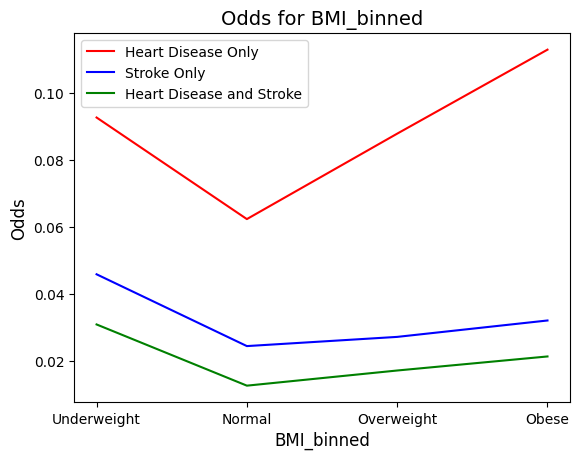

In [ ]:
# THREE LEVEL ODDS GRAPHS
from matplotlib.ticker import MaxNLocator

#remaining_columns = data.columns[1:3].tolist() + data.columns[5:6].tolist() + data.columns[7:14].tolist() + data.columns[17:22].tolist()

# calculate odds for each remaining variable
for idx, col_name in enumerate(remaining_columns, start=1):
    selected_columns = ['HeartDiseaseorAttack', 'Stroke', col_name]

    # contingency table
    contingency_table = pd.crosstab(index=[data[selected_columns[0]], data[selected_columns[1]]],
                                    columns=data[selected_columns[2]])

    # odds for Heart Disease, Stroke, and Combined
    odds = np.zeros((contingency_table.shape[1], 4),dtype='object')
    for i, category in enumerate(contingency_table.columns):
        # odds of the event occurring in the Heart Disease group (Heart Disease = 1)
        odds_hd = contingency_table.loc[(1, 0), category] / contingency_table.loc[(0, 0), category]

        # odds of the event occurring in the Stroke group (Stroke = 1)
        odds_stroke = contingency_table.loc[(0, 1), category] / contingency_table.loc[(0, 0), category]

        # odds of the event occurring in the Combined group (Heart Disease = 1, Stroke = 1)
        odds_combined = contingency_table.loc[(1, 1), category] / contingency_table.loc[(0, 0), category]

        odds[i] = [category, odds_hd, odds_stroke, odds_combined]

    # output
    odds_df = pd.DataFrame(odds, columns=[col_name, 'Odds_HeartDisease', 'Odds_Stroke', 'Odds_Combined'])
    print("Odds for", col_name)
    print(odds_df)
    print("\n")

    # plot the odds
    fig, ax = plt.subplots()

    ax.plot(odds_df[col_name], odds_df['Odds_HeartDisease'], color='red', label='Heart Disease Only')
    ax.plot(odds_df[col_name], odds_df['Odds_Stroke'], color='blue', label='Stroke Only')
    ax.plot(odds_df[col_name], odds_df['Odds_Combined'], color='green', label='Heart Disease and Stroke')

     # set x-axis labels
    if col_name == 'BMI_binned':
        x_ticks = odds_df[col_name]
    else:
        x_ticks = np.arange(int(odds_df[col_name].min()), int(odds_df[col_name].max()) + 1, 1)

    ax.set_xticks(x_ticks)
    ax.set_xticklabels(x_ticks, fontsize=10)

    ax.set_xlabel(col_name, fontsize=12)
    ax.set_ylabel('Odds', fontsize=12)
    ax.set_title(f"Odds for {col_name}", fontsize=14)

    ax.legend()
    plt.show()

In [ ]:
# ODDS FOR TWO INPUT VARIABLES

largest_odds_list = []

# odds for each unique pair of remaining variables
for idx1, col_name1 in enumerate(remaining_columns, start=1):
    for idx2, col_name2 in enumerate(remaining_columns[idx1:], start=idx1+1):
        
        selected_columns = ['HeartDiseaseorAttack', 'Stroke', col_name1, col_name2]

        # contingency table
        contingency_table = pd.crosstab(index=[data[selected_columns[0]], data[selected_columns[1]]],
                                        columns=[data[selected_columns[2]], data[selected_columns[3]]])

        # odds for Heart Disease, Stroke, and Combined for each combination of input variables
        odds = []
        for category in contingency_table.columns:
            odds_hd = contingency_table.loc[(1, 0), category] / contingency_table.loc[(0, 0), category]
            odds_stroke = contingency_table.loc[(0, 1), category] / contingency_table.loc[(0, 0), category]
            odds_combined = contingency_table.loc[(1, 1), category] / contingency_table.loc[(0, 0), category]

            odds.append([col_name1, category[0], col_name2, category[1], odds_hd, odds_stroke, odds_combined])

        # odds df
        odds_df = pd.DataFrame(odds, columns=['Variable_1', 'Value_1', 'Variable_2', 'Value_2', 'Odds_HeartDisease', 'Odds_Stroke', 'Odds_Combined'])
        
        # largest odds values for each category and their corresponding input variable values
        largest_hd = odds_df.loc[odds_df['Odds_HeartDisease'].idxmax()]
        largest_stroke = odds_df.loc[odds_df['Odds_Stroke'].idxmax()]
        largest_combined = odds_df.loc[odds_df['Odds_Combined'].idxmax()]

        # add the largest odds values to the list
        largest_odds_list.extend([largest_hd, largest_stroke, largest_combined])
        
        print("Odds for", col_name1, "and", col_name2)
        print(odds_df)
        print("\n")
        
        print("Highest Odds Value for Heart Disease:")
        print("Variable_1:", max_odds_hd_row['Variable_1'], "Value_1:", max_odds_hd_row['Value_1'])
        print("Variable_2:", max_odds_hd_row['Variable_2'], "Value_2:", max_odds_hd_row['Value_2'])
        print("Odds_HeartDisease:", max_odds_hd_row['Odds_HeartDisease'])
        print("\n")
        
        print("Highest Odds Value for Stroke:")
        print("Variable_1:", max_odds_stroke_row['Variable_1'], "Value_1:", max_odds_stroke_row['Value_1'])
        print("Variable_2:", max_odds_stroke_row['Variable_2'], "Value_2:", max_odds_stroke_row['Value_2'])
        print("Odds_Stroke:", max_odds_stroke_row['Odds_Stroke'])
        print("\n")
        
        print("Highest Odds Value for Combined:")
        print("Variable_1:", max_odds_combined_row['Variable_1'], "Value_1:", max_odds_combined_row['Value_1'])
        print("Variable_2:", max_odds_combined_row['Variable_2'], "Value_2:", max_odds_combined_row['Value_2'])
        print("Odds_Combined:", max_odds_stroke_row['Odds_Combined'])
        print("\n")

# list to df
largest_odds_df = pd.DataFrame(largest_odds_list)

# sort df
largest_odds_df = largest_odds_df.sort_values(by=['Odds_Combined', 'Odds_HeartDisease', 'Odds_Stroke'], ascending=False)
largest_odds_df.reset_index(drop=True, inplace=True)

# output
print("Largest odds values:")
print(largest_odds_df)

In [ ]:
#%% ODDS CODE EXCLUDING SMALL DENOMINATORS
# SORTED ODDS DATA FRAMES FOR TWO INPUT VARIABLES

largest_odds_list = []

# odds for each unique pair of remaining variables
for idx1, col_name1 in enumerate(remaining_columns, start=1):
    for idx2, col_name2 in enumerate(remaining_columns[idx1:], start=idx1+1):
        
        selected_columns = ['HeartDiseaseorAttack', 'Stroke', col_name1, col_name2]

        # contingency table
        contingency_table = pd.crosstab(index=[data[selected_columns[0]], data[selected_columns[1]]],
                                        columns=[data[selected_columns[2]], data[selected_columns[3]]])

        # odds for Heart Disease, Stroke, and Combined for each combination of input variables
        odds = []
        for category in contingency_table.columns:
            denominator_hd = contingency_table.loc[(0, 0), category]
            denominator_stroke = contingency_table.loc[(0, 0), category]
            denominator_combined = contingency_table.loc[(0, 0), category]

            if denominator_hd >= 30:
                odds_hd = contingency_table.loc[(1, 0), category] / denominator_hd
            else:
                odds_hd = None

            if denominator_stroke >= 30:
                odds_stroke = contingency_table.loc[(0, 1), category] / denominator_stroke
            else:
                odds_stroke = None

            if denominator_combined >= 30:
                odds_combined = contingency_table.loc[(1, 1), category] / denominator_combined
            else:
                odds_combined = None

            odds.append([col_name1, category[0], col_name2, category[1], odds_hd, odds_stroke, odds_combined])

        # output
        odds_df = pd.DataFrame(odds, columns=['Variable_1', 'Value_1', 'Variable_2', 'Value_2', 'Odds_HeartDisease', 'Odds_Stroke', 'Odds_Combined'])
        odds_df = odds_df.dropna()

        if not odds_df.empty:
            # largest values
            max_odds_hd_row = odds_df.loc[odds_df['Odds_HeartDisease'].idxmax()]
            max_odds_stroke_row = odds_df.loc[odds_df['Odds_Stroke'].idxmax()]
            max_odds_combined_row = odds_df.loc[odds_df['Odds_Combined'].idxmax()]

            largest_odds_list.extend([max_odds_hd_row, max_odds_stroke_row, max_odds_combined_row])

# list to df
largest_odds_df = pd.DataFrame(largest_odds_list)

# split into separate dfs for readability
largest_hd_odds_df = largest_odds_df.iloc[:,[0,1,2,3,4]].sort_values(by='Odds_HeartDisease', ascending=False)
largest_stroke_odds_df = largest_odds_df.iloc[:,[0,1,2,3,5]].sort_values(by='Odds_Stroke', ascending=False)
largest_combined_odds_df = largest_odds_df.iloc[:,[0,1,2,3,6]].sort_values(by='Odds_Combined', ascending=False)


NameError: ignored

ENTROPY

In [ ]:
#%% CONDITIONAL ENTROPY LOOP WITH LARGEST OUTPUT (SINGLE VARIABLE)
for column in remaining_columns:
    # joint probability distribution P(X, Y)
    joint_prob = pd.crosstab(index=data[column], columns=[data['HeartDiseaseorAttack'], data['Stroke']], normalize='all')

    # marginal probability distribution P(X)
    marginal_prob_X = joint_prob.sum(axis=1)

    # conditional probability distribution P(Y|X)
    conditional_prob_Y_given_X = joint_prob.div(marginal_prob_X, axis=0)

    # conditional entropy H(Y|X=x) for each level of X
    conditional_entropy_Y_given_X = -np.sum(conditional_prob_Y_given_X * np.log2(conditional_prob_Y_given_X + 1e-9), axis=1)

    # largest values
    largest_conditional_entropy = conditional_entropy_Y_given_X.max()
    largest_conditional_entropy_value = conditional_entropy_Y_given_X.idxmax()

    # output
    print(f"Conditional Entropy for {column}:")
    for x in conditional_entropy_Y_given_X.index:
        print(f"  H(Y|X={x}): {conditional_entropy_Y_given_X.loc[x]}")
    
    # largest value output
    print(f"\nLargest Conditional Entropy for {column}: {largest_conditional_entropy} (associated with X={largest_conditional_entropy_value})\n")

Conditional Entropy for HighBP:
  H(Y|X=0.0): 0.37115749240872414
  H(Y|X=1.0): 0.9915345625608892

Largest Conditional Entropy for HighBP: 0.9915345625608892 (associated with X=1.0)

Conditional Entropy for HighChol:
  H(Y|X=0.0): 0.43690476681523494
  H(Y|X=1.0): 0.9385896438183643

Largest Conditional Entropy for HighChol: 0.9385896438183643 (associated with X=1.0)

Conditional Entropy for Smoker:
  H(Y|X=0.0): 0.5236765672119938
  H(Y|X=1.0): 0.8441076048686723

Largest Conditional Entropy for Smoker: 0.8441076048686723 (associated with X=1.0)

Conditional Entropy for Diabetes:
  H(Y|X=0.0): 0.5618575492551228
  H(Y|X=1.0): 0.8940099791236702
  H(Y|X=2.0): 1.1823138602895036

Largest Conditional Entropy for Diabetes: 1.1823138602895036 (associated with X=2.0)

Conditional Entropy for PhysActivity:
  H(Y|X=0.0): 0.9023596874819009
  H(Y|X=1.0): 0.5945024782431911

Largest Conditional Entropy for PhysActivity: 0.9023596874819009 (associated with X=0.0)

Conditional Entropy for Fruits

ENTROPY-- SORTED

In [ ]:
# SINGLE VARIABLE ENTROPY LOOP WITH SORTED VALUES

entropy_list = []

# CONDITIONAL ENTROPY LOOP WITH LARGEST OUTPUT
for column in remaining_columns:
    # joint probability distribution P(X, Y)
    joint_prob = pd.crosstab(index=data[column], columns=[data['HeartDiseaseorAttack'], data['Stroke']], normalize='all')

    # marginal probability distribution P(X)
    marginal_prob_X = joint_prob.sum(axis=1)

    # conditional probability distribution P(Y|X)
    conditional_prob_Y_given_X = joint_prob.div(marginal_prob_X, axis=0)

    # conditional entropy H(Y|X=x) for each level of X
    conditional_entropy_Y_given_X = -np.sum(conditional_prob_Y_given_X * np.log2(conditional_prob_Y_given_X + 1e-9), axis=1)

    # store values
    for x in conditional_entropy_Y_given_X.index:
        entropy_list.append([column, x, conditional_entropy_Y_given_X.loc[x]])

# list to df
entropy_df = pd.DataFrame(entropy_list, columns=['Variable', 'Value', 'Conditional_Entropy'])

# sort values
sorted_entropy_df = entropy_df.sort_values(by='Conditional_Entropy', ascending=False)

# output
print(sorted_entropy_df)

NameError: ignored

In [ ]:
#%% TWO VARIABLE CONDITIONAL ENTROPY LOOP WITH LARGEST OUTPUT-- SIMILAR TO ABOVE, BUT TAKES LARGEST VALUES FROM EACH ITERATION AND PUTS THEM IN A SINGLE SORTED DATA FRAME

largest_conditional_entropy_list = []

# conditional entropy for each unique pair of remaining variables
for idx1, col_name1 in enumerate(remaining_columns, start=1):
    for idx2, col_name2 in enumerate(remaining_columns[idx1:], start=idx1+1):

        # joint probability distribution P(X1, X2, Y)
        joint_prob = pd.crosstab(index=[data[col_name1], data[col_name2]], columns=[data['HeartDiseaseorAttack'], data['Stroke']], normalize='all')

        # marginal probability distribution P(X1, X2)
        marginal_prob_X = joint_prob.sum(axis=1)

        # conditional probability distribution P(Y|X1, X2)
        conditional_prob_Y_given_X = joint_prob.div(marginal_prob_X, axis=0)

        # conditional entropy H(Y|X1=x1, X2=x2) for each level of X1 and X2
        conditional_entropy_Y_given_X = -np.sum(conditional_prob_Y_given_X * np.log2(conditional_prob_Y_given_X + 1e-9), axis=1)

        # largest value
        largest_conditional_entropy = conditional_entropy_Y_given_X.max()
        largest_conditional_entropy_values = conditional_entropy_Y_given_X.idxmax()

        # store values
        largest_conditional_entropy_list.append({
            'Variable_1': col_name1,
            'Value_1': largest_conditional_entropy_values[0],
            'Variable_2': col_name2,
            'Value_2': largest_conditional_entropy_values[1],
            'Largest_Conditional_Entropy': largest_conditional_entropy
        })

# list to df
largest_conditional_entropy_df = pd.DataFrame(largest_conditional_entropy_list)

# sort
largest_conditional_entropy_df = largest_conditional_entropy_df.sort_values(by='Largest_Conditional_Entropy', ascending=False)
largest_conditional_entropy_df.reset_index(drop=True, inplace=True)

# output
print("Largest conditional entropy values:")
print(largest_conditional_entropy_df)

Largest conditional entropy values:
            Variable_1  Value_1         Variable_2      Value_2  \
0             Diabetes      2.0         BMI_binned  Underweight   
1          NoDocbcCost      1.0                Age         12.0   
2             Diabetes      2.0           DiffWalk          1.0   
3             Diabetes      2.0          Education          1.0   
4             DiffWalk      1.0          Education          1.0   
..                 ...      ...                ...          ...   
115      AnyHealthcare      1.0                Sex          1.0   
116  HvyAlcoholConsump      0.0                Sex          1.0   
117             Fruits      0.0  HvyAlcoholConsump          0.0   
118             Fruits      0.0      AnyHealthcare          1.0   
119  HvyAlcoholConsump      0.0      AnyHealthcare          1.0   

     Largest_Conditional_Entropy  
0                       1.507106  
1                       1.505488  
2                       1.505026  
3                  

**Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [ ]:
X = data.drop('HeartDiseaseorAttack', axis=1) # drop the target variable
y = data['HeartDiseaseorAttack']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
pd.DataFrame(classification_report(y_test, y_pred, output_dict=True))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.914726,0.549828,0.908448,0.732277,0.880693
recall,0.991457,0.101437,0.908448,0.546447,0.908448
f1-score,0.951547,0.171276,0.908448,0.561412,0.878774
support,46004.000000,4732.000000,0.908448,50736.000000,50736.000000


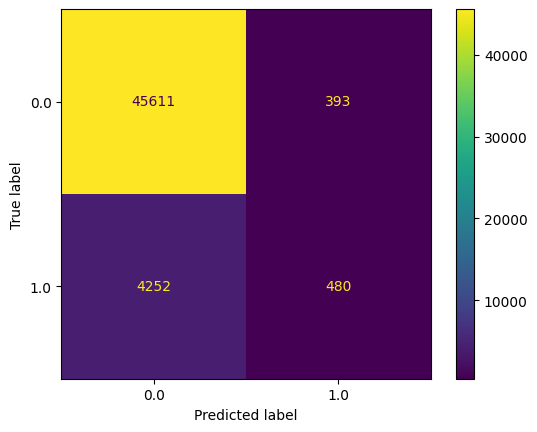

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

Oversampling

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


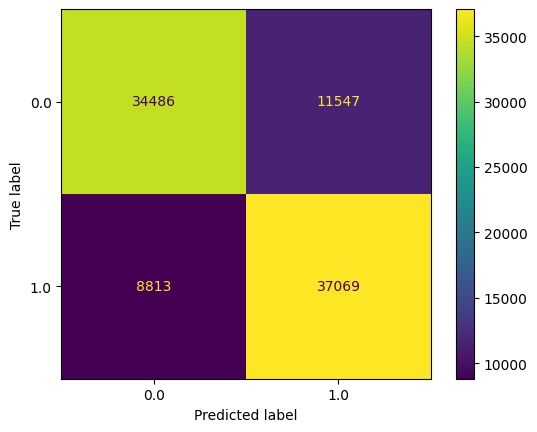

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, confusion_matrix
#oversampling
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

In [ ]:
pd.DataFrame(classification_report(y_test, y_pred, output_dict=True))

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.796462,0.762486,0.778491,0.779474,0.779502
recall,0.749158,0.807920,0.778491,0.778539,0.778491
f1-score,0.772086,0.784546,0.778491,0.778316,0.778306
support,46033.000000,45882.000000,0.778491,91915.000000,91915.000000


Undersampling

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


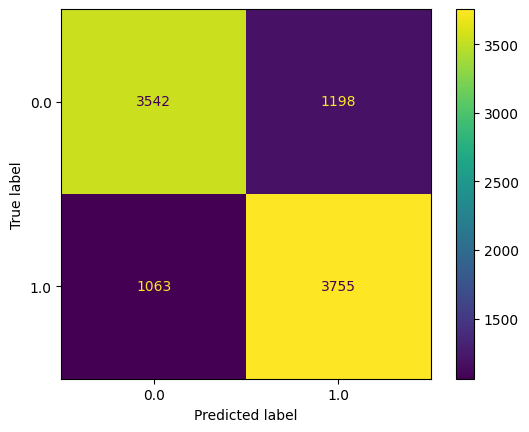

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
X_under,y_under = rus.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_under, y_under, test_size=0.2, random_state=42)

logreg = LogisticRegression(random_state=42)
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

In [ ]:
pd.DataFrame(classification_report(y_test, y_pred, output_dict=True))

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.769164,0.758126,0.763444,0.763645,0.763600
recall,0.747257,0.779369,0.763444,0.763313,0.763444
f1-score,0.758052,0.768601,0.763444,0.763327,0.763370
support,4740.000000,4818.000000,0.763444,9558.000000,9558.000000


Log reg interpretation

In [ ]:
import math
e=math.e
coefs = logreg.coef_

In [ ]:
pd.DataFrame({"Feature":X_train.columns, "beta_i":coefs[0], "odds_ratio":e**coefs[0]})

,Feature,beta_i,odds_ratio
0,HighBP,0.576825,1.780377
1,HighChol,0.653362,1.921992
2,CholCheck,-0.804672,0.447235
3,BMI,-0.015463,0.984656
4,Smoker,0.376245,1.456804
5,Stroke,1.523520,4.588348
6,Diabetes,0.162873,1.176887
7,PhysActivity,0.030238,1.030700
8,Fruits,-0.056982,0.944612
9,Veggies,-0.067427,0.934796


In [ ]:
# Import RandomForest Packages
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

In [ ]:
# Remove target columns and run undersampling
X = data.drop('HeartDiseaseorAttack', axis=1)
X = X.drop('Stroke', axis=1)
y = data['HeartDiseaseorAttack']
rus = RandomUnderSampler(random_state=42)
X_under,y_under = rus.fit_resample(X, y)

# Code for creating the RandomForest for HeartDiseaseorAttack
y = y_under
X_train, X_test, y_train, y_test = train_test_split(X_under, y, stratify=y, test_size=0.1, random_state=100)

HDA_forest = RandomForestClassifier(n_estimators=100, random_state=100)
HDA_forest.fit(X_train, y_train)
print('Accuracy on test set: {:.2f}'.format(HDA_forest.score(X_test, y_test)))

Accuracy on test set: 0.74


In [ ]:
# Code for Stroke RandomForest
X1 = data
X1 = X1.drop('HeartDiseaseorAttack', axis=1)
X1 = X1.drop('Stroke', axis=1)
y1 = data['Stroke']
rus1 = RandomUnderSampler(random_state=42)
X1_under,Stroke_y_under = rus1.fit_resample(X1, y1)

X1_train, X1_test, Stroke_y_train, Stroke_y_test = train_test_split(X1_under, Stroke_y_under, stratify=Stroke_y_under, test_size=0.3, random_state=100)

Stroke_forest = RandomForestClassifier(n_estimators=100, random_state=100)
Stroke_forest.fit(X1_train, Stroke_y_train)
print('Accuracy on test set: {:.2f}'.format(Stroke_forest.score(X1_test, Stroke_y_test)))

Accuracy on test set: 0.74


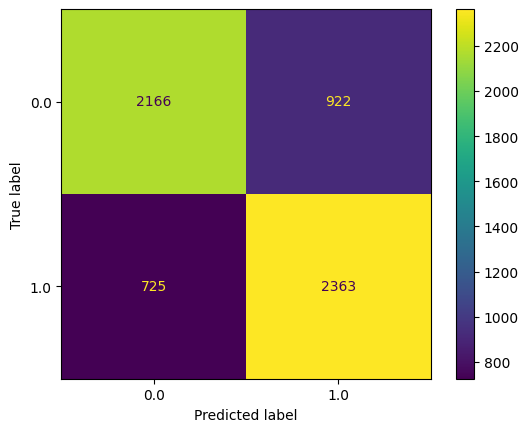

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, HDA_pred)

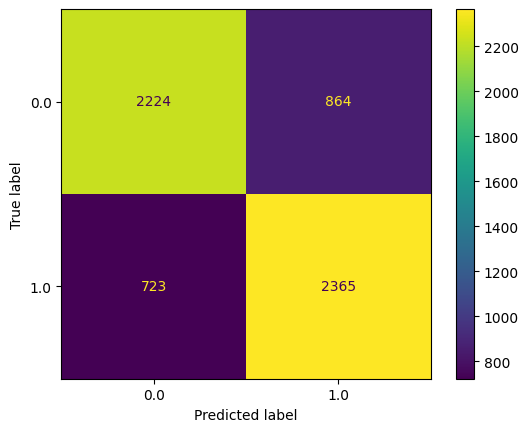

In [ ]:
ConfusionMatrixDisplay.from_predictions(Stroke_y_test, Stroke_pred)

In [ ]:
pd.DataFrame(classification_report(y_test, HDA_pred, output_dict=True))

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.749222,0.719330,0.733323,0.734276,0.734276
recall,0.701425,0.765220,0.733323,0.733323,0.733323
f1-score,0.724536,0.741566,0.733323,0.733051,0.733051
support,3088.000000,3088.000000,0.733323,6176.000000,6176.000000


In [ ]:
pd.DataFrame(classification_report(Stroke_y_test, Stroke_pred, output_dict=True))

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.983421,0.970219,0.983089,0.976820,0.982885
recall,0.999219,0.601555,0.983089,0.800387,0.983089
f1-score,0.991257,0.742651,0.983089,0.866954,0.981173
support,24339.000000,1029.000000,0.983089,25368.000000,25368.000000


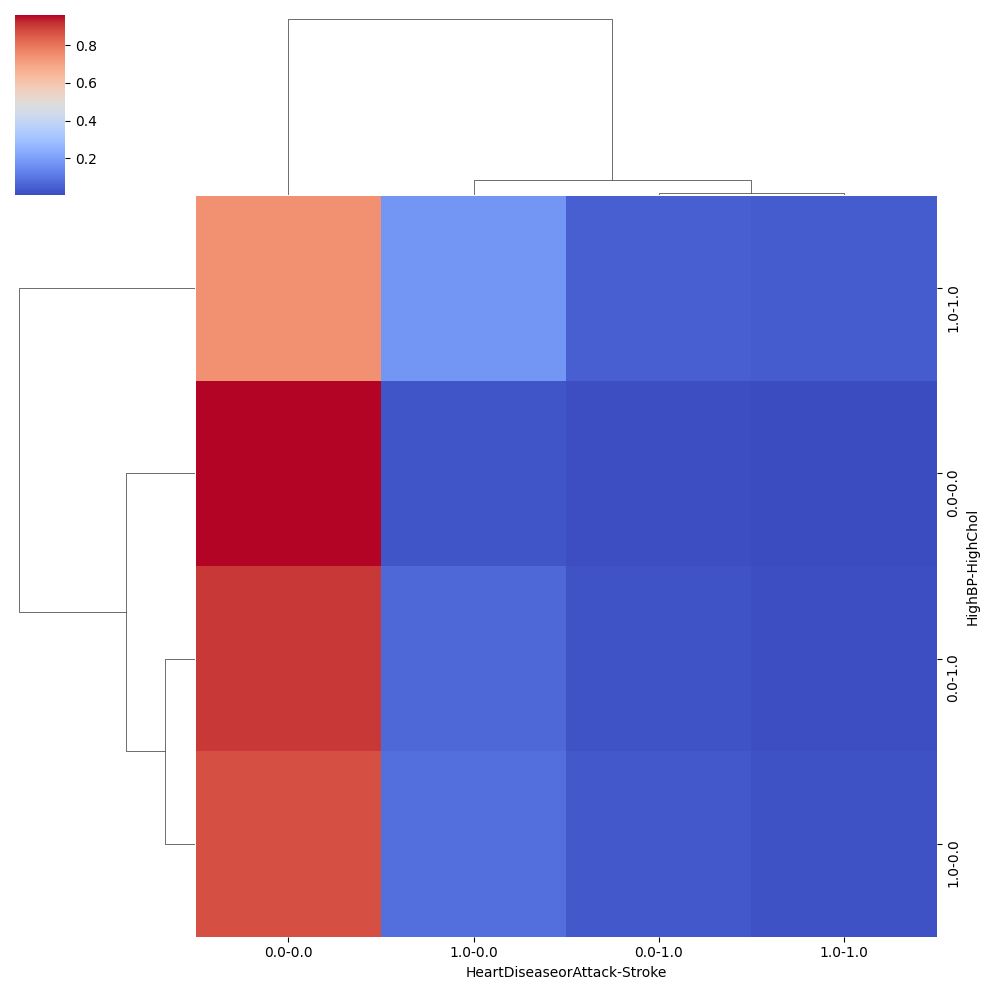

In [ ]:
# conditioning on Y (HD+stroke)
contingency= pd.crosstab(index=[data['HighBP'], data['HighChol']],
                                columns=[data['HeartDiseaseorAttack'], data['Stroke']])
row_sums = contingency.sum(axis=1)
contingency_table_proportions = contingency.div(row_sums,axis=0)
contingency_table_proportions 
g= sns.clustermap(contingency_table_proportions, cmap='coolwarm', metric='euclidean', method='ward')

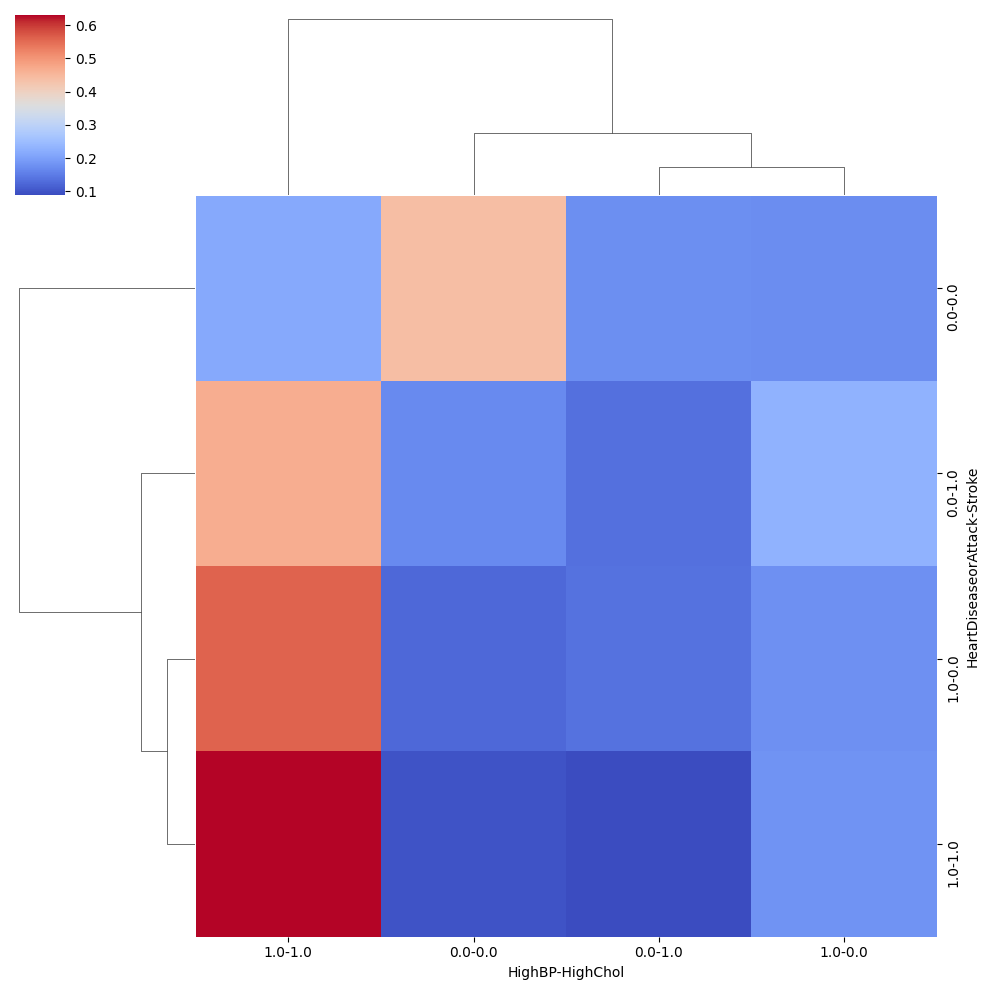

In [ ]:
# conditioning on Y (HD+stroke)
contingency= pd.crosstab(index=[data['HeartDiseaseorAttack'], data['Stroke']],
                                columns=[data['HighBP'], data['HighChol']])
row_sums = contingency.sum(axis=1)
contingency_table_proportions = contingency.div(row_sums,axis=0)
contingency_table_proportions 
g= sns.clustermap(contingency_table_proportions, cmap='coolwarm', metric='euclidean', method='ward')

130 cluster maps with flipped axis.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:715: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self._figure = plt.figure(figsize=figsize)


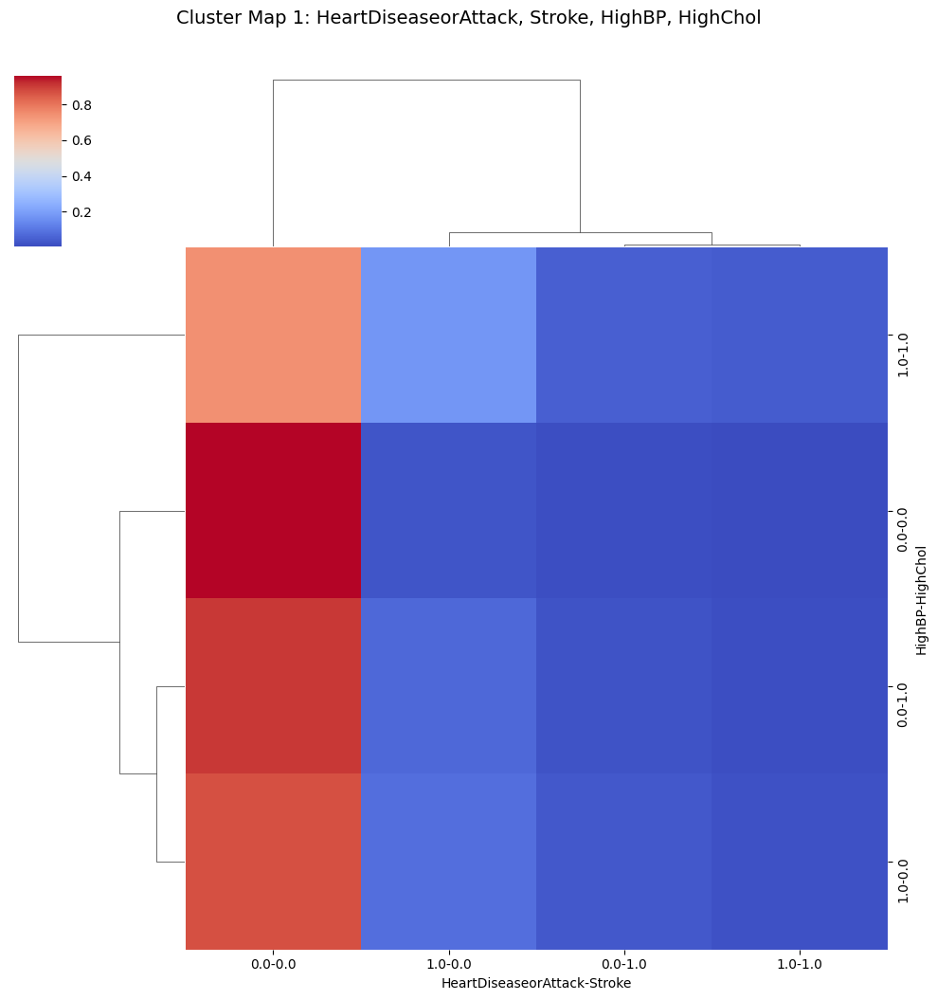

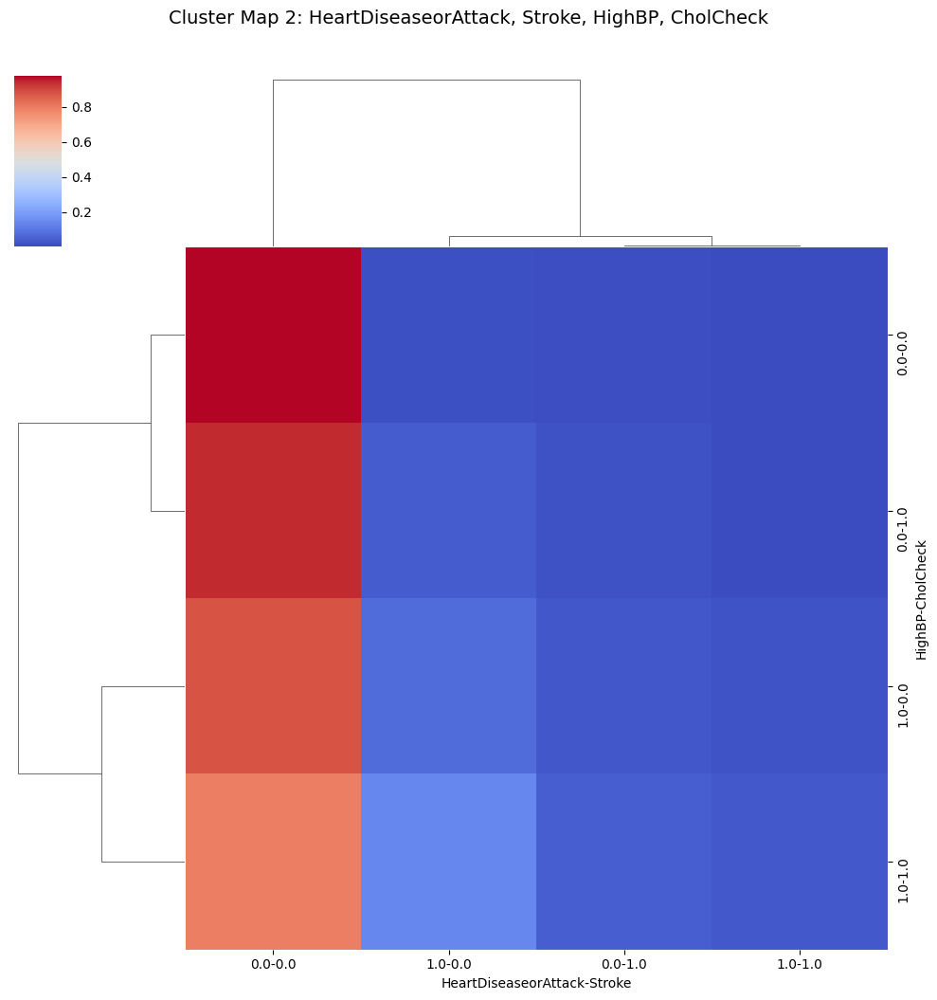

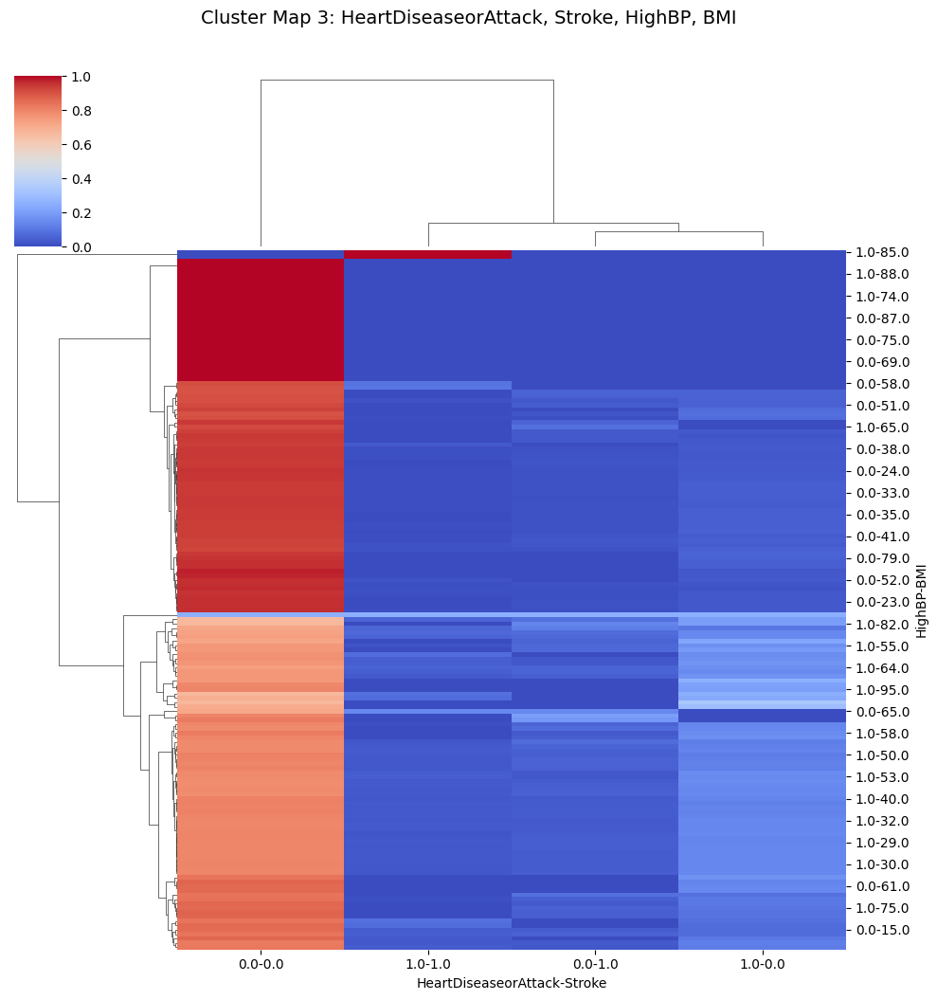

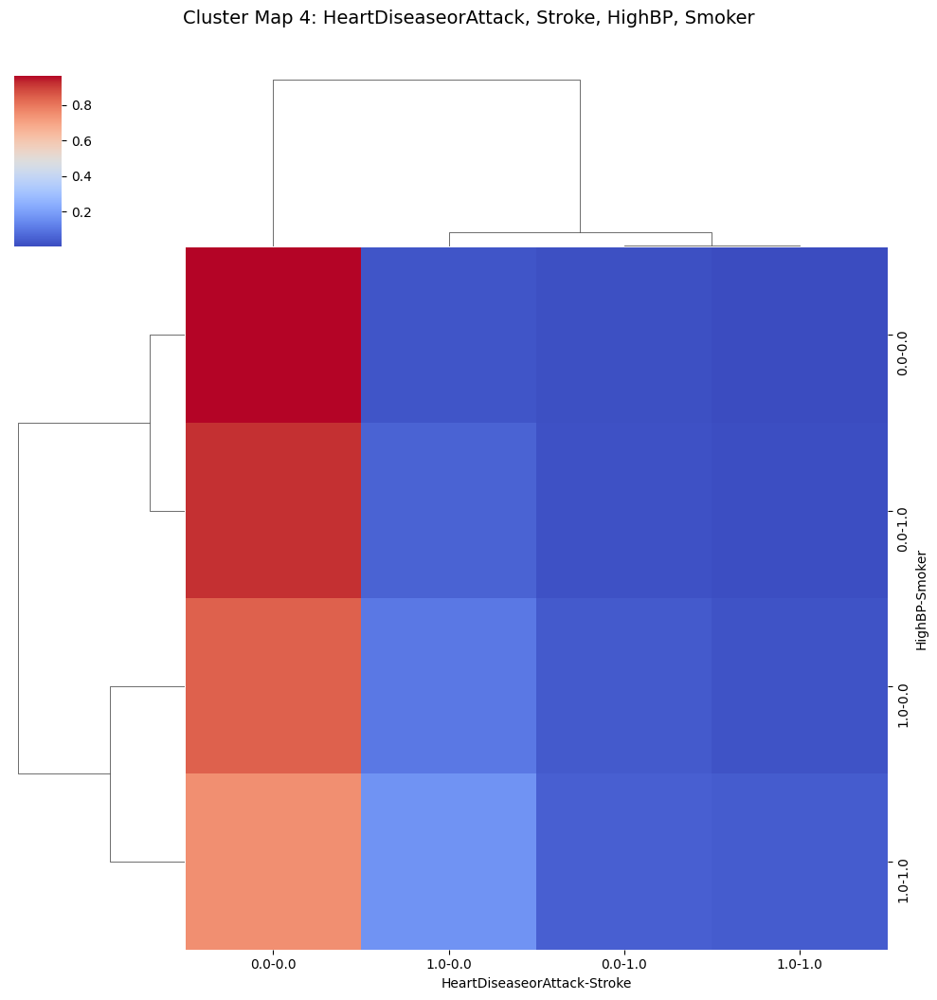

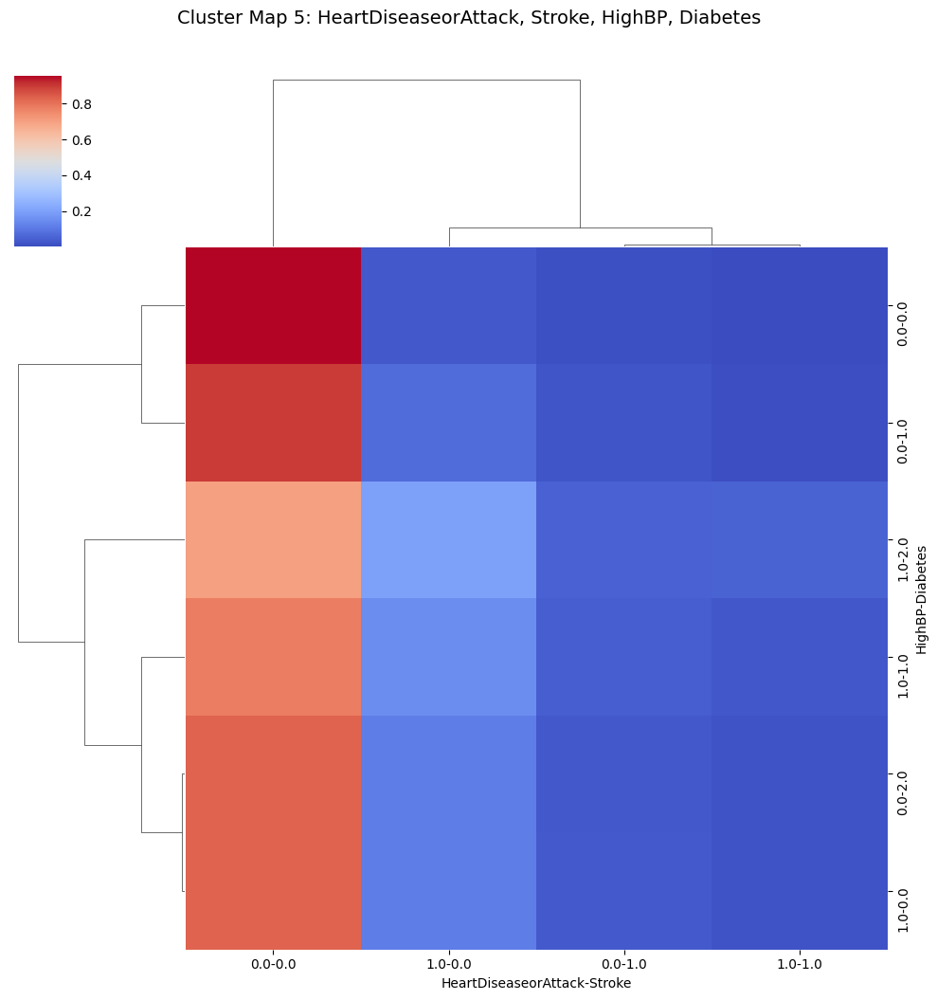

...

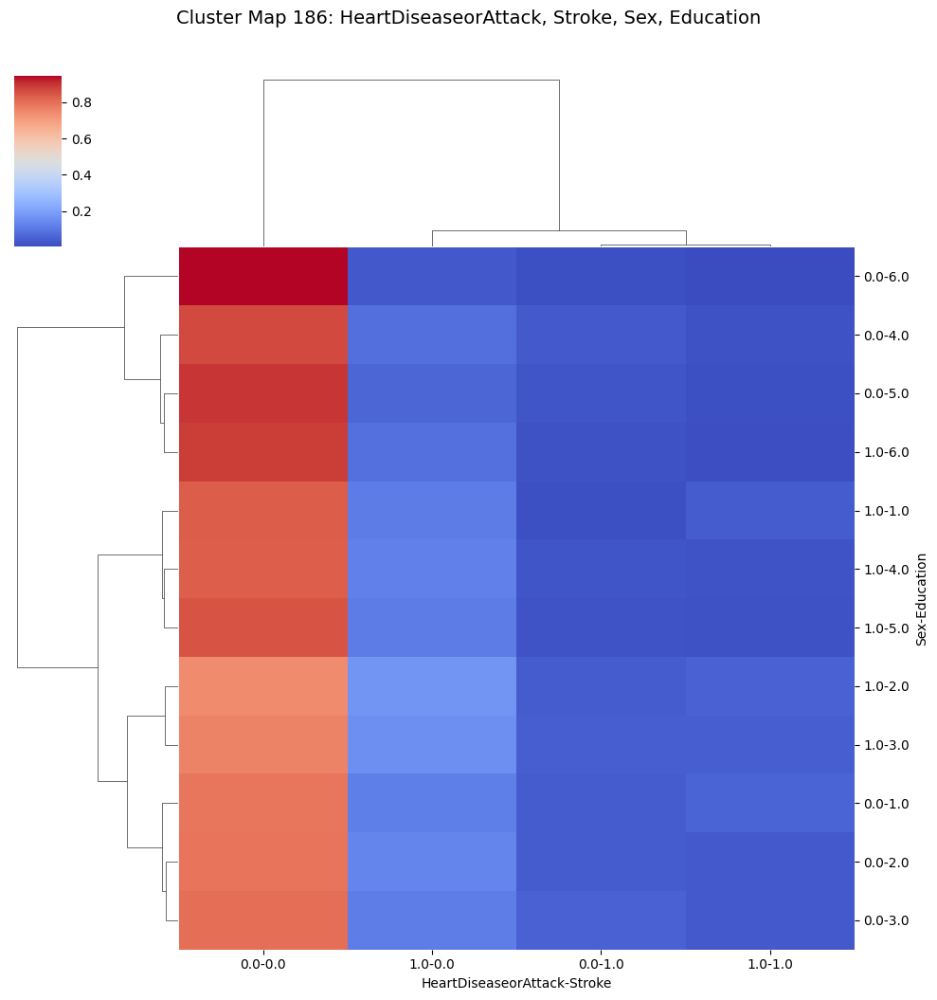

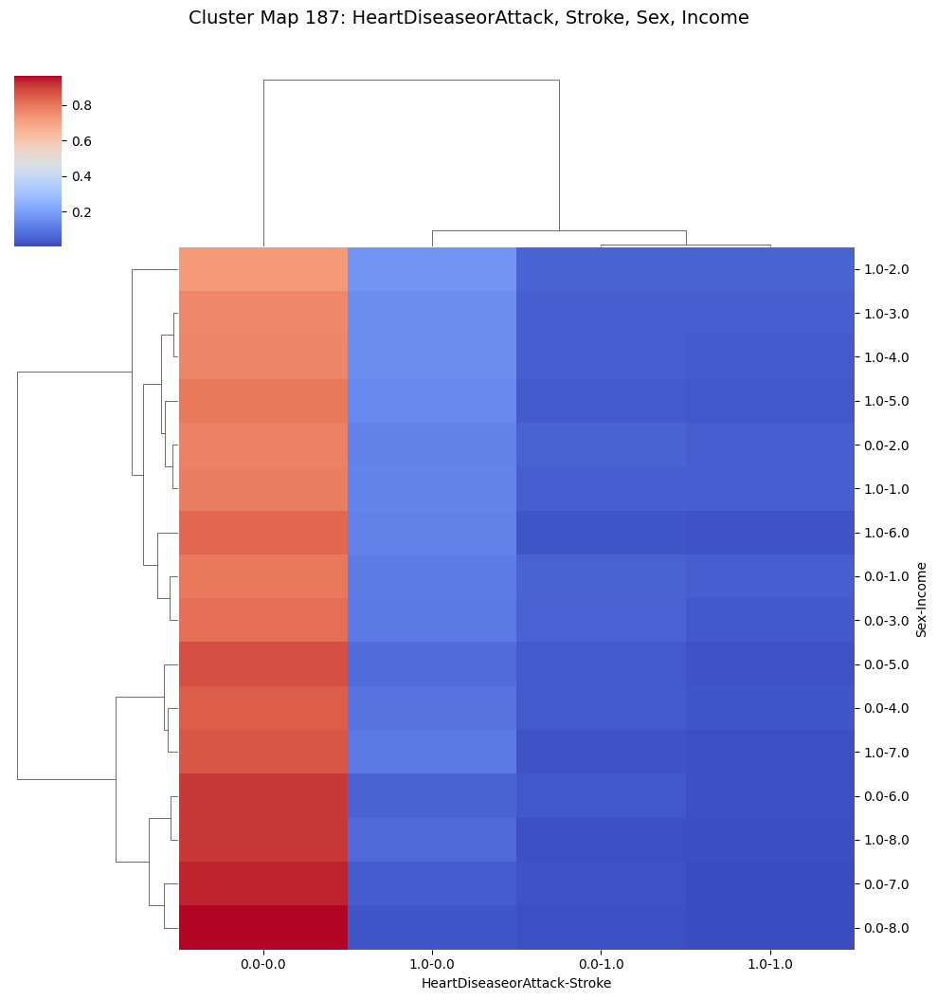

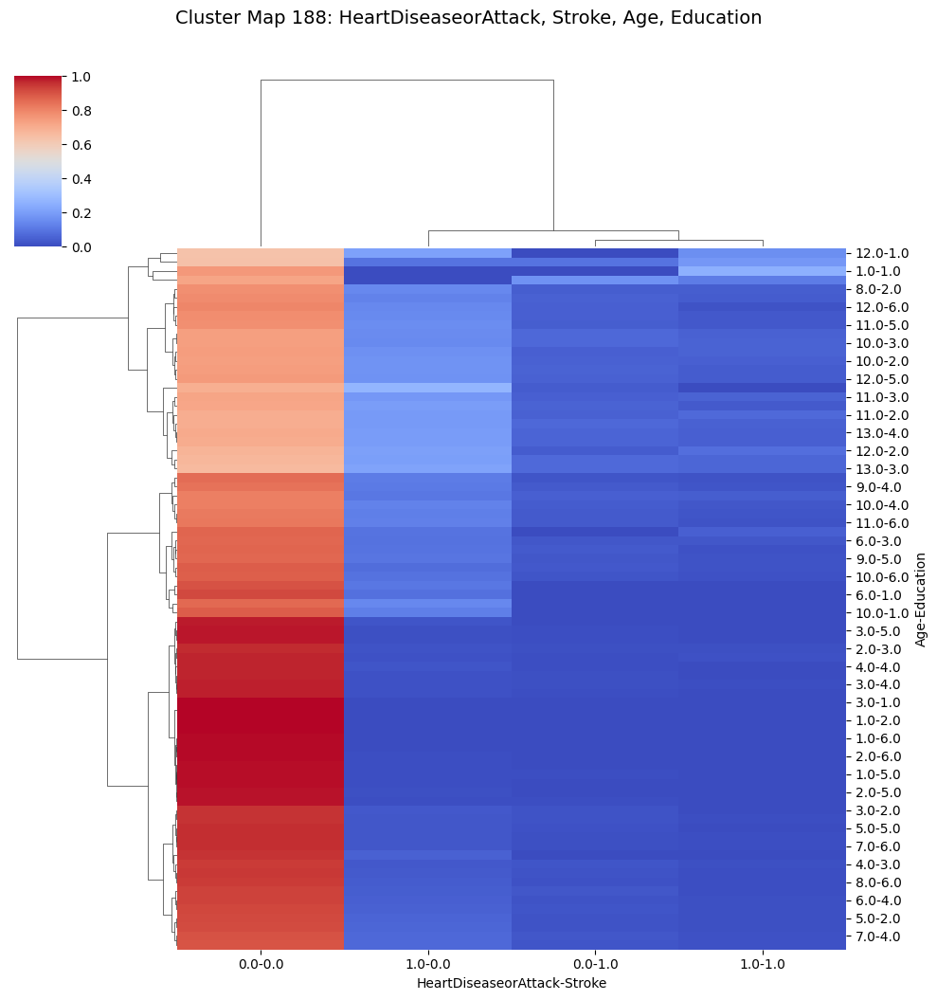

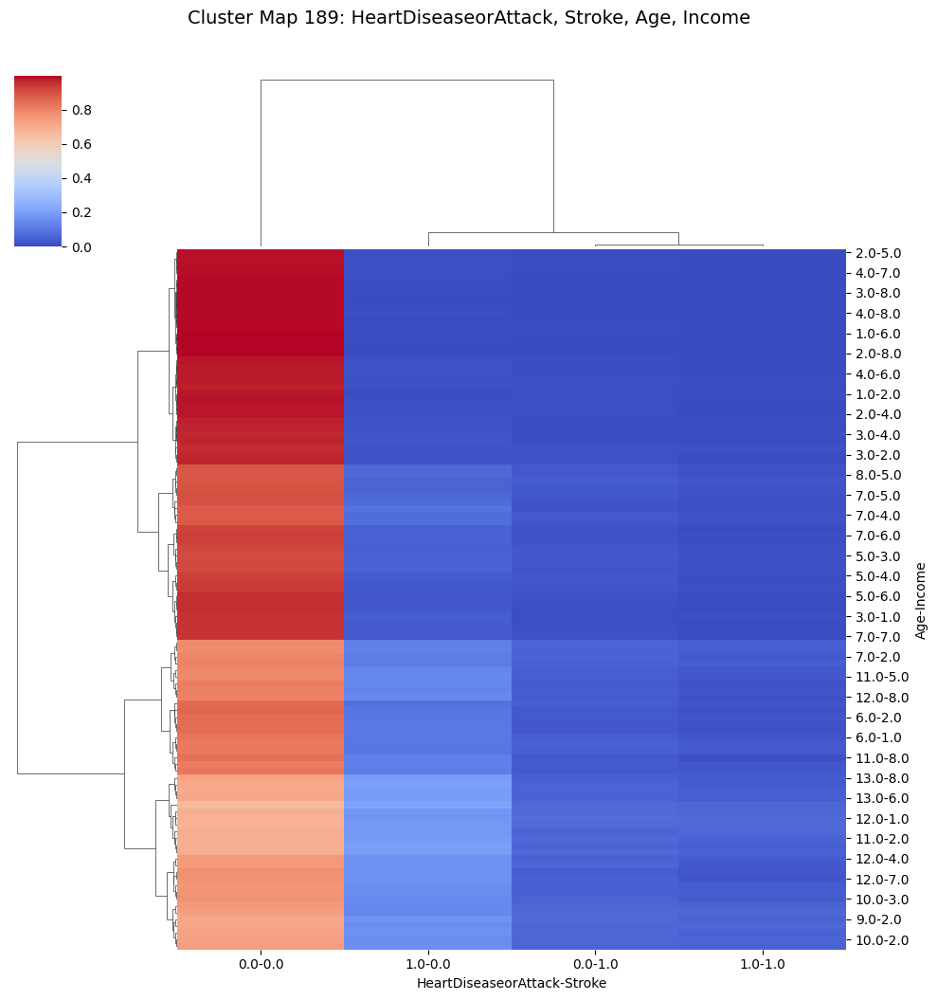

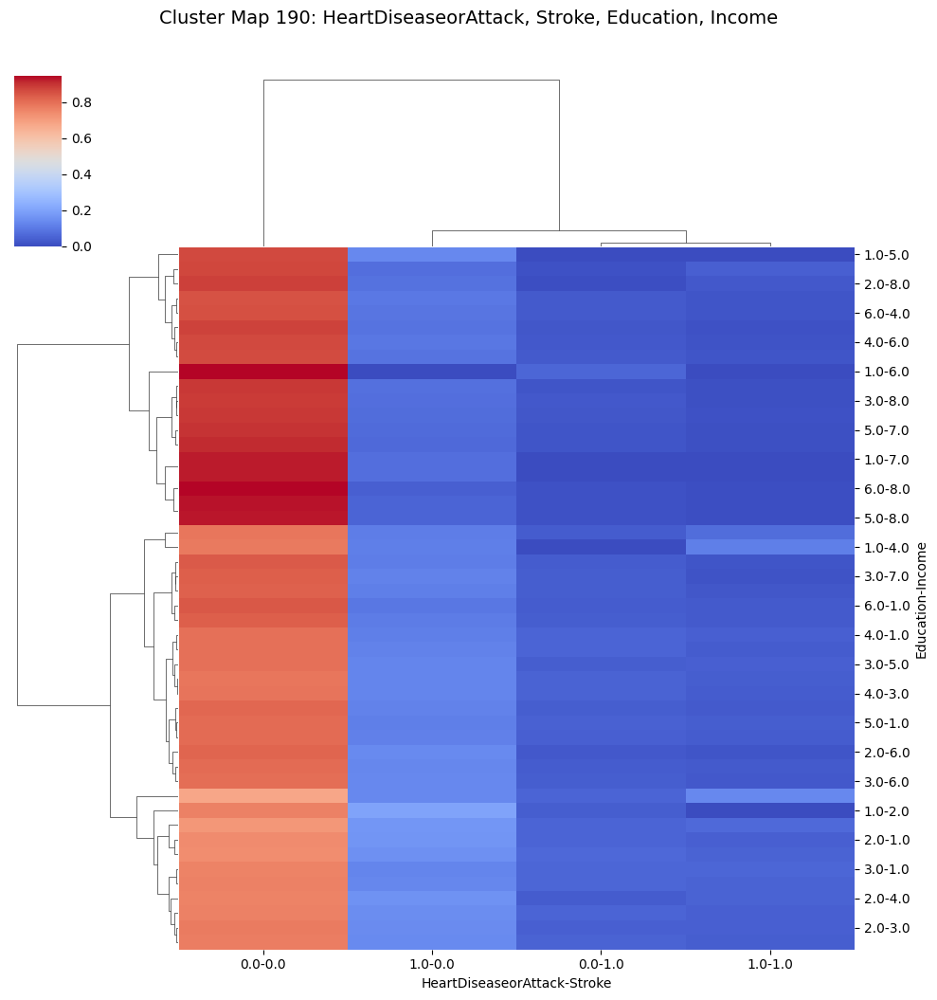

In [ ]:
from itertools import combinations
import seaborn as sns

# Get the columns to be used in combinations
remaining_columns = data.columns[1:6].tolist() + data.columns[7:].tolist()

# Generate all possible column combinations
column_combinations = list(combinations(remaining_columns, 2))

# Create cluster maps for each combination
for idx, combination in enumerate(column_combinations, start=1):
    selected_columns = ['HeartDiseaseorAttack', 'Stroke'] + list(combination)

    # Create the contingency table
    contingency_table = pd.crosstab(index=[data[selected_columns[2]], data[selected_columns[3]]],
                                    columns=[data[selected_columns[0]], data[selected_columns[1]]])

    # Calculate row-wise proportions
    row_sums = contingency_table.sum(axis=1)
    contingency_table_proportions = contingency_table.div(row_sums, axis=0)

    # Create cluster map using the contingency table with proportions
    g = sns.clustermap(contingency_table_proportions, cmap='coolwarm', metric='euclidean', method='ward')

    # Set plot title
    g.fig.suptitle(f"Cluster Map {idx}: {', '.join(selected_columns)}", fontsize=14, y=1.05)